In [1]:
from urllib.request import urlopen
import json
import pandas as pd
#import plotly.graph_objects as go
#import plotly.figure_factory as ff
import plotly.express as px

import xarray as xr
import numpy as np

In [2]:
from dask.distributed import Client, performance_report
client = Client()  # Connect to distributed cluster and override default
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 8,Total memory: 30.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33381,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 8
Started: Just now,Total memory: 30.00 GiB
Comm: tcp://127.0.0.1:32873,Total threads: 2
Dashboard: http://127.0.0.1:38999/status,Memory: 7.50 GiB
Nanny: tcp://127.0.0.1:40577,


2024-05-17 10:37:47,659 - distributed.nanny.memory - WARNING - Worker tcp://127.0.0.1:32873 (pid=941) exceeded 95% memory budget. Restarting...
2024-05-17 10:37:47,677 - distributed.scheduler - WARNING - Removing worker 'tcp://127.0.0.1:32873' caused the cluster to lose already computed task(s), which will be recomputed elsewhere: {'original-open_dataset-t2m-d6558863dfcc3d3e9460506d07684d96'} (stimulus_id='handle-worker-cleanup-1715942267.677273')
2024-05-17 10:37:47,680 - distributed.nanny - WARNING - Restarting worker
2024-05-17 10:37:50,360 - distributed.nanny.memory - WARNING - Worker tcp://127.0.0.1:44237 (pid=949) exceeded 95% memory budget. Restarting...
2024-05-17 10:37:50,379 - distributed.scheduler - WARNING - Removing worker 'tcp://127.0.0.1:44237' caused the cluster to lose already computed task(s), which will be recomputed elsewhere: {'original-open_dataset-t2m-d6558863dfcc3d3e9460506d07684d96'} (stimulus_id='handle-worker-cleanup-1715942270.3788946')
2024-05-17 10:37:50,3

In [95]:
xds = xr.open_mfdataset("/home/susannaioni/s3/data/era5/monthly/2m_temperature*")

#xds = xds.isel(latitude=slice(None, None, -1))

In [96]:
xds.coords['longitude'] = (xds.coords['longitude'] + 180) % 360 - 180
xds = xds.sortby(xds.longitude)

In [97]:
xds = xds.isel(latitude=slice(None, None, -1))

In [90]:
xda_t2m = xds.sel(latitude=slice(33.431441,72.816074), longitude=slice(-26.191406, 39.375000))["t2m"]

In [ ]:
fig = px.imshow(xda_t2m, animation_frame='time', zmin=250, zmax=300, color_continuous_scale='RdBu_r',width=800, height=800)
fig.update_layout(
    yaxis = dict(autorange=False)
)
fig.show()

# GBIF data

In [ ]:
# Example load csv in order to choose the columns we need
pdf = pd.read_csv("/home/susannaioni/s3/data/gbif/R_Ferr/occurrence.txt", sep="\t", nrows=2)

In [ ]:
# We need this setting to display all columns
pd.set_option('display.max_columns', None)
pdf

In [67]:
# Load whole dataset with selected columns and specified datatypes
pdf = pd.read_csv("/home/susannaioni/s3/data/gbif/R_Ferr/occurrence.txt", 
                  sep="\t", 
                  usecols=["gbifID", 
                           "collectionCode", 
                           "basisOfRecord", 
                           "eventDate", 
                           "year",
                           "month",
                           "day",
                           "decimalLatitude", 
                           "decimalLongitude",
                           "coordinateUncertaintyInMeters",
                           "scientificName"
                          ],
                  #parse_dates=[4],
                  dtype={"year":"Int32",
                         "month":"Int32",
                         "day":"Int32",
                         "decimalLatitude":"Float32",
                         "decimalLongitude":"Float32",
                         "coordinateUncertaintyInMeters":"Float32",
                         "scientificName":"str"},
                   #na_values=["NA"]
                 )

In [68]:
pdf = pdf.dropna(subset=['year','month'])

In [79]:
pdf = pdf[pdf.year>=1940].sort_values(by=["year","month","day"])

In [80]:
pdf['time'] = pdf['year'].astype(str) + '-' + pdf['month'].astype(str)

In [81]:
pdf['time'] = pd.to_datetime(pdf['date'], format='%Y-%m')

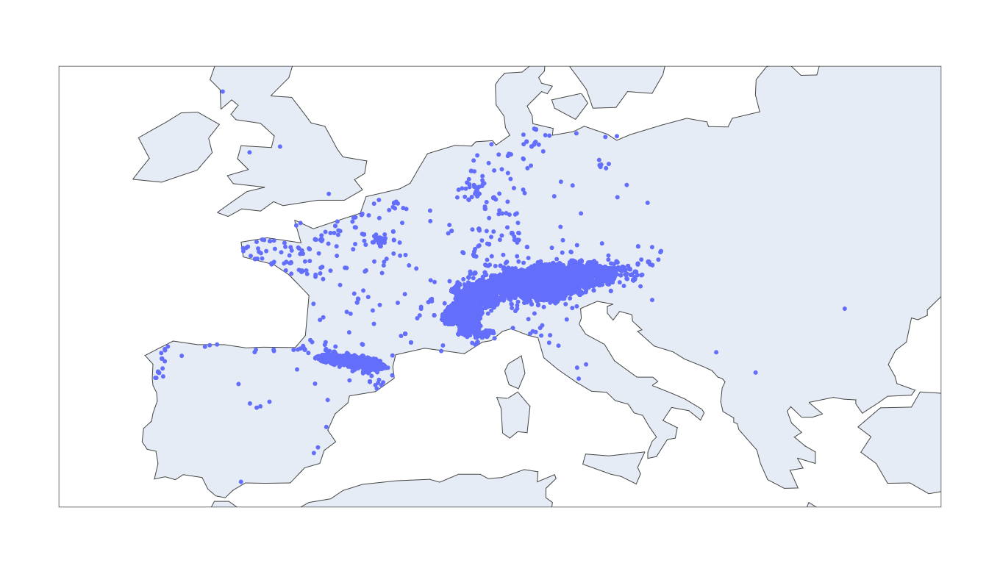

In [86]:
fig = px.scatter_geo(pdf,lon = "decimalLongitude", lat = "decimalLatitude", width=800, height=800, fitbounds="locations", hover_data=["scientificName","coordinateUncertaintyInMeters"])
#fig.update_layout(
#    yaxis = dict(autorange=False)
#)
fig.show()

In [98]:
# Use gbif occurance data and extract nearest habitat code
xds_nearest = xds.sel(latitude=pdf.decimalLatitude.values,longitude=pdf.decimalLongitude.values, time=pdf.date.values, method="nearest")
#nearest_habitat = nearest_habitat.compute()

/home/susannaioni/.conda/envs/hda_1.19/lib/python3.12/site-packages/xarray/core/indexing.py:1598: PerformanceWarning:

Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]



In [104]:
df_from_da = xds.t2m.to_dataframe(name='da_value').reset_index()

In [105]:
merged_df = pd.merge(pdf, df_from_da, on=['time', 'latitude', 'longitude'], how='inner')

,time,latitude,longitude,da_value
0,1940-01-01,-90.0,-180.00,243.332649
1,1940-01-01,-90.0,-179.75,243.332649
2,1940-01-01,-90.0,-179.50,243.332649
3,1940-01-01,-90.0,-179.25,243.332649
4,1940-01-01,-90.0,-179.00,243.332649
...,...,...,...,...
37376635,1942-12-01,90.0,178.75,246.260800
37376636,1942-12-01,90.0,179.00,246.260800
37376637,1942-12-01,90.0,179.25,246.260800
37376638,1942-12-01,90.0,179.50,246.260800


In [103]:
xds_nearest.isel(time=0).t2m.plot()

2024-05-17 10:37:46,351 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 5.27 GiB -- Worker memory limit: 7.50 GiB
2024-05-17 10:37:46,894 - distributed.worker.memory - WARNING - Worker is at 80% memory usage. Pausing worker.  Process memory: 6.01 GiB -- Worker memory limit: 7.50 GiB
2024-05-17 10:37:48,957 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 5.27 GiB -- Worker memory limit: 7.50 GiB
2024-05-17 10:37:49,612 - distributed.worker.memory - WARNING - Worker is at 80% memory usage. Pausing worker.  Process memo

KilledWorker: Attempted to run task ('concatenate-open_dataset-getitem-a7076c9dd940f5920f83d82702ad6a75', 0, 0) on 4 different workers, but all those workers died while running it. The last worker that attempt to run the task was tcp://127.0.0.1:33549. Inspecting worker logs is often a good next step to diagnose what went wrong. For more information see https://distributed.dask.org/en/stable/killed.html.

# Example

In [ ]:

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/fips-unemp-16.csv",
                   dtype={"fips": str})

fig = go.Figure(go.Choroplethmapbox(geojson=counties, locations=df.fips, z=df.unemp,
                                    colorscale="Viridis", zmin=0, zmax=12,
                                    marker_opacity=0.5, marker_line_width=0))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()